In [1]:
import numpy as np
import pandas as pd

import sys
import os

# Absolute path to the utils directory
utils_path = os.path.abspath(r".\utils")

# Add it to sys.path
if utils_path not in sys.path:
    sys.path.append(utils_path)

In [2]:
# Necessary to not clog the output for pdf
import warnings
from scipy.sparse import SparseEfficiencyWarning

warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=SparseEfficiencyWarning)

# Utilities

In [3]:
def resolve_duplicates(df: pd.DataFrame) -> pd.DataFrame:
    """
    Resolves duplicate Area Code entries by merging rows and prioritizing Area names
    that contain 'County' or 'City'.

    For each duplicated 'Area Code':
    - Keeps the Area name that includes the keywords 'County' or 'City' if available.
    - Merges numeric and other columns by taking the last non-null value per column.
    
    Parameters
    ----------
    df : pd.DataFrame
        DataFrame containing 'Area Code', 'Area', and numeric indicator columns.

    Returns
    -------
    pd.DataFrame
        Cleaned DataFrame with one row per Area Code, preserving preferred Area names
        and combining available data.
    """
    df = df.copy()
    
    # Mark preferred rows where Area contains 'County' or 'City'
    df['Preferred_Area'] = df['Area'].str.contains(r'\b(County|City)\b', case=False, na=False)

    # Sort so preferred Area name comes last within each group
    df = df.sort_values(['Area Code', 'Preferred_Area'])

    # Group by Area Code and take last non-null per column (preferred Area is last)
    df_merged = df.groupby('Area Code').agg(lambda x: x.dropna().iloc[-1] if not x.dropna().empty else np.nan)

    # Reset index and drop helper column
    df_merged = df_merged.drop(columns='Preferred_Area', errors='ignore').reset_index()

    return df_merged

Authorities_types = ['Unitary Authority','London Borough','Non-metropolitan District','Metropolitan District']

File publicly available at: https://www.ons.gov.uk/peoplepopulationandcommunity/wellbeing/datasets/subnationalindicatorsdataset/december2022

In [4]:
# Get file

file_path = r"..\Datasets\subnationalindicatorsdatasetdecember2022correction.xlsx"

# Raw Data (no imputation)

## Economic view

In [5]:
gva_per_hour_df = pd.read_excel(file_path,
                              sheet_name='GVA per hour', header=8)

weekly_pay_df = pd.read_excel(file_path,
                              sheet_name='Weekly pay', header=8)
weekly_pay_df.drop(columns=['Lower 95% Confidence Interval','Upper 95% Confidence Interval'], inplace=True) # drop the Notes column

employment_df = pd.read_excel(file_path,
                              sheet_name='Employment rate', header=8)
employment_df.drop(columns=['Lower 95% Confidence Interval','Upper 95% Confidence Interval'], inplace=True) # drop the Notes column

gdhi_per_head_df = pd.read_excel(file_path,
                              sheet_name='GDHI per head', header=8)

# Start with the first DataFrame
economic_df = gva_per_hour_df.copy()

# Sequentially merge
join_cols = ['Area Level', 'Area Code', 'Area ']
economic_df = economic_df.merge(weekly_pay_df, on=join_cols, how='outer')
economic_df = economic_df.merge(employment_df, on=join_cols, how='outer')
economic_df = economic_df.merge(gdhi_per_head_df, on=join_cols, how='outer')

# Rename Area column to remove trailing space
economic_df.rename(columns={'Area ': 'Area'}, inplace=True)

# Handle duplicates if any
economic_df = resolve_duplicates(economic_df)
# Filter for English Authorities
economic_df = economic_df[economic_df['Area Code'].str.startswith('E')]

display(economic_df[economic_df['Area Level'].isin(Authorities_types)])

,Area Code,Area Level,Area,Gross Value Added (GVA) per hour worked (£),Gross median weekly pay (£),"Employment rate, ages 16-64 (%)","Gross disposable household income, per head (£)"
0,E06000001,Unitary Authority,Hartlepool,31.85,487.4,67.2,16627.0
1,E06000002,Unitary Authority,Middlesbrough,30.96,420.8,64.4,16496.0
2,E06000003,Unitary Authority,Redcar and Cleveland,28.14,439.2,66.1,17095.0
3,E06000004,Unitary Authority,Stockton-on-Tees,38.36,469.4,71.1,17892.0
4,E06000005,Unitary Authority,Darlington,31.87,486.7,75.4,18114.0
...,...,...,...,...,...,...,...
304,E09000029,London Borough,Sutton,36.59,565.8,76.2,25227.0
305,E09000030,London Borough,Tower Hamlets,67.60,680.3,71.4,26175.0
306,E09000031,London Borough,Waltham Forest,35.87,624.7,74.3,25486.0
307,E09000032,London Borough,Wandsworth,36.52,746.7,85.6,40793.0


## Connectivity view

In [6]:
public_transport_to_employer_df = pd.read_excel(file_path,
                              sheet_name='Public transport to employer', header=10)
public_transport_to_employer_df.drop(columns='Notes', inplace=True) # drop the Notes column

drive_to_employer_df = pd.read_excel(file_path,
                              sheet_name='Drive to employer', header=10)
drive_to_employer_df.drop(columns='Notes', inplace=True) # drop the Notes column

cycle_to_employer_df = pd.read_excel(file_path,
                              sheet_name='Cycle to employer', header=10)
cycle_to_employer_df.drop(columns='Notes', inplace=True) # drop the Notes column

broadband_availability_df = pd.read_excel(file_path,
                              sheet_name='Broadband availability', header=6)

fourG_area_coverage_df = pd.read_excel(file_path,
                              sheet_name='4G area coverage', header=6)

# Start with the first DataFrame
connectivity_df = public_transport_to_employer_df.copy()

# Sequentially merge
join_cols = ['Area Level', 'Area Code', 'Area ']
connectivity_df = connectivity_df.merge(drive_to_employer_df, on=join_cols, how='outer')
connectivity_df = connectivity_df.merge(cycle_to_employer_df, on=join_cols, how='outer')
connectivity_df = connectivity_df.merge(broadband_availability_df, on=join_cols, how='outer')
connectivity_df = connectivity_df.merge(fourG_area_coverage_df, on=join_cols, how='outer')

# Rename Area column to remove trailing space
connectivity_df.rename(columns={'Area ': 'Area'}, inplace=True)

# Handle duplicates if any
connectivity_df = resolve_duplicates(connectivity_df)
# Filter for English Authorities
connectivity_df = connectivity_df[connectivity_df['Area Code'].str.startswith('E')]

display(connectivity_df[connectivity_df['Area Level'].isin(Authorities_types)])

,Area Code,Area Level,Area,"Average travel time in minutes to reach nearest large employment centre (500 to 4999 jobs available), by public transport or walking (minutes)","Average travel time in minutes to reach nearest large employment centre (500 to 4999 jobs available), by car (minutes)","Average travel time in minutes to reach nearest large employment centre (500 to 4999 jobs available), by cycle (minutes)",Percentage of premises with gigabit-capable broadband (%),Percentage of 4G coverage by at least one mobile network operator (%)
0,E06000001,Unitary Authority,Hartlepool,12.900208,7.790802,10.070582,89.0,99.92
1,E06000002,Unitary Authority,Middlesbrough,15.372879,8.457817,11.335077,93.5,100.00
2,E06000003,Unitary Authority,Redcar and Cleveland,13.259369,8.066075,11.103287,86.9,99.25
3,E06000004,Unitary Authority,Stockton-on-Tees,13.181988,7.818049,10.050299,91.2,99.98
4,E06000005,Unitary Authority,Darlington,11.023619,7.457621,9.488321,83.4,100.00
...,...,...,...,...,...,...,...,...
335,E09000029,London Borough,Sutton,8.983597,6.960970,8.060928,84.9,100.00
336,E09000030,London Borough,Tower Hamlets,4.350891,6.150660,6.578729,75.0,100.00
337,E09000031,London Borough,Waltham Forest,7.248019,6.727718,7.463746,86.6,100.00
338,E09000032,London Borough,Wandsworth,6.247846,6.595966,7.121423,79.7,100.00


## Educational Attainment view

In [7]:
KS2_attainment_df = pd.read_excel(file_path,
                              sheet_name='KS2 attainment', header=8)
KS2_attainment_df.drop(columns='Notes', inplace=True) # drop the Notes column

gcse_df = pd.read_excel(file_path,
                              sheet_name='GCSE by age 19', header=9)

ofsted_df = pd.read_excel(file_path,
                              sheet_name='Ofsted', header=8)

persistent_absences_df = pd.read_excel(file_path,
                              sheet_name='Persistent absences', header=8)
persistent_absences_df.drop(columns='Notes', inplace=True) # drop the Notes column

persistent_absences_FSM_df = pd.read_excel(file_path,
                              sheet_name='Persistent absences FSM', header=8)

persistent_absences_CLA_df = pd.read_excel(file_path,
                              sheet_name='Persistent absences CLA', header=8)
persistent_absences_CLA_df.drop(columns='Notes', inplace=True) # drop the Notes column

early_years_comms_df = pd.read_excel(file_path,
                              sheet_name='Early years comms', header=8)
early_years_comms_df.drop(columns='Notes', inplace=True) # drop the Notes column

early_years_literacy_df = pd.read_excel(file_path,
                              sheet_name='Early years literacy', header=8)
early_years_literacy_df.drop(columns='Notes', inplace=True) # drop the Notes column

early_years_maths_df = pd.read_excel(file_path,
                              sheet_name='Early years maths', header=8)
early_years_maths_df.drop(columns='Notes', inplace=True) # drop the Notes column

edu_attainment_dfs = [
    gcse_df,
    ofsted_df,
    persistent_absences_df,
    persistent_absences_FSM_df,
    persistent_absences_CLA_df,
    early_years_comms_df,
    early_years_literacy_df,
    early_years_maths_df,
    # fe_skills_df,
    # apprenticeships_start_df,
    # apprenticeships_achievements_df,
    # level3plus_qual_df,
    # fe_participation_df
]

# Start with the first DataFrame
edu_attainment_df = KS2_attainment_df.copy()

# Sequentially merge
join_cols = ['Area Level', 'Area Code', 'Area']

for df in edu_attainment_dfs:
    edu_attainment_df = edu_attainment_df.merge(df, on=join_cols, how='outer')

# Handle duplicates if any
edu_attainment_df = resolve_duplicates(edu_attainment_df)
# Filter for English Authorities
edu_attainment_df = edu_attainment_df[edu_attainment_df['Area Code'].str.startswith('E')]

display(edu_attainment_df[edu_attainment_df['Area Level'].isin(Authorities_types)])

,Area Code,Area Level,Area,"Percentage of pupils in state-funded schools meeting the expected standard in reading, writing and maths by end of primary school (%)",Percentage of young people achieving GCSEs (and equivalent qualifications) in English and maths by age 19 (%),Percentage of schools rated good or outstanding by Ofsted (%),Percentage of Persistent absences (10% or more missed) for all pupils (%),Percentage of persistent absences (10% or more missed) eligible for free school meals in the past 6 years (%),Percentage of persistent absences (10% or more missed) for pupils who are looked after (%),Percentage of 5-year olds achieving 'expected level' in communication early learning goals (%),Percentage of 5-year olds achieving 'expected level' in literacy early learning goals (%),Percentage of 5-year olds achieving 'expected level' in maths early learning goals (%)
0,E06000001,Unitary Authority,Hartlepool,68.0,70.461237,89.473684,16.33809,26.52582,30.6,79.3,73.5,76.9
1,E06000002,Unitary Authority,Middlesbrough,64.0,69.535415,92.727273,16.6714,23.86576,30.2,71.8,63.9,68.2
2,E06000003,Unitary Authority,Redcar and Cleveland,70.0,69.888231,84.482759,11.98731,21.004,24.7,79.9,72.2,77.6
3,E06000004,Unitary Authority,Stockton-on-Tees,71.0,73.065015,93.589744,11.7852,23.19617,33.9,84.4,74.6,79.9
4,E06000005,Unitary Authority,Darlington,66.0,73.363636,83.333333,11.87857,21.26717,27.2,78.1,73.2,77.1
...,...,...,...,...,...,...,...,...,...,...,...,...
304,E09000029,London Borough,Sutton,73.0,84.200158,96.825397,11.70044,25.31646,31.3,81.6,75.0,79.8
305,E09000030,London Borough,Tower Hamlets,72.0,75.573956,96.808511,10.33017,13.63271,13.3,77.9,72.0,75.4
306,E09000031,London Borough,Waltham Forest,72.0,75.171625,92.307692,14.81726,22.53172,38.2,83.3,78.1,81.4
307,E09000032,London Borough,Wandsworth,70.0,77.402746,94.117647,11.79685,20.5931,32.1,84.5,79.1,83.3


## Skills view

In [8]:
# fe_skills_df = pd.read_excel(file_path,
#                               sheet_name='FE and skills achievements', header=7)

apprenticeships_start_df = pd.read_excel(file_path,
                              sheet_name='Apprenticeship starts', header=9)

apprenticeships_achievements_df = pd.read_excel(file_path,
                              sheet_name='Apprenticeship achievements', header=9)

level3plus_qual_df = pd.read_excel(file_path,
                              sheet_name='Level 3+ qualifications', header=8)
level3plus_qual_df.drop(columns=['Lower 95% Confidence Interval','Upper 95% Confidence Interval'], inplace=True) # drop the confidence intervals column

fe_participation_df = pd.read_excel(file_path,
                              sheet_name='FE and skills participation', header=9)

skills_dfs = [
    # apprenticeships_start_df,
    apprenticeships_achievements_df,
    level3plus_qual_df,
    fe_participation_df
]

# Start with the first DataFrame
skills_df = apprenticeships_start_df.copy()

# Sequentially merge
join_cols = ['Area Level', 'Area Code', 'Area']

for df in skills_dfs:
    skills_df = skills_df.merge(df, on=join_cols, how='outer')

# Handle duplicates if any
skills_df = resolve_duplicates(skills_df)
# Filter for English Authorities
skills_df = skills_df[skills_df['Area Code'].str.startswith('E')]

display(skills_df[skills_df['Area Level'].isin(Authorities_types)])

,Area Code,Area Level,Area,"Apprenticeships started by adults aged 16+ based on home address (per 100,000 population)","Apprenticeships achieved by adults aged 16+ based on home address (per 100,000 population)",Proportion of the population aged 16-64 with NVQ3+ qualification (%),"19+ further education and skills participation (per 100,000 population)"
0,E06000001,Unitary Authority,Hartlepool,1155,646,56.4,8448
1,E06000002,Unitary Authority,Middlesbrough,1021,535,48.7,9094
2,E06000003,Unitary Authority,Redcar and Cleveland,1205,686,53.3,7272
3,E06000004,Unitary Authority,Stockton-on-Tees,1158,610,58.8,7260
4,E06000005,Unitary Authority,Darlington,1124,603,60.7,6704
...,...,...,...,...,...,...,...
304,E09000029,London Borough,Sutton,702,366,70.5,4575
305,E09000030,London Borough,Tower Hamlets,624,246,64.8,4874
306,E09000031,London Borough,Waltham Forest,623,260,71.5,5765
307,E09000032,London Borough,Wandsworth,518,208,80.2,4006


## Health view

In [9]:
female_HLE_df = pd.read_excel(file_path,
                              sheet_name='Female HLE', header=12)
female_HLE_df.drop(columns=['Lower 95% Confidence Interval','Upper 95% Confidence Interval'], inplace=True) # drop the confidence intervals column

male_HLE_df = pd.read_excel(file_path,
                              sheet_name='Male HLE', header=12)
male_HLE_df.drop(columns=['Lower 95% Confidence Interval','Upper 95% Confidence Interval'], inplace=True) # drop the confidence intervals column

smokers_df = pd.read_excel(file_path,
                              sheet_name='Smokers', header=8)
smokers_df.drop(columns=['Lower 95% Confidence Interval','Upper 95% Confidence Interval','Notes'], inplace=True) # drop the confidence intervals column

overweight_df = pd.read_excel(file_path,
                              sheet_name='Overweight reception', header=10)
overweight_df.drop(columns=['Lower 95% Confidence Interval','Upper 95% Confidence Interval','Observation status','Notes'], inplace=True) # drop the confidence intervals column

overweight_ysix_df = pd.read_excel(file_path,
                              sheet_name='Overweight year 6', header=10)
overweight_ysix_df.drop(columns=['Lower 95% Confidence Interval','Upper 95% Confidence Interval','Observation status','Notes'], inplace=True) # drop the confidence intervals column

overweight_adults_df = pd.read_excel(file_path,
                              sheet_name='Overweight adult', header=10)
overweight_adults_df.drop(columns=['Lower 95% Confidence Interval','Upper 95% Confidence Interval','Notes'], inplace=True) # drop the confidence intervals column

cancer_df = pd.read_excel(file_path,
                              sheet_name='Cancer diagnosis', header=10)
cancer_df.drop(columns=['Lower 95% Confidence Interval','Upper 95% Confidence Interval','Observation status'], inplace=True) # drop the confidence intervals column

mortality_df = pd.read_excel(file_path,
                              sheet_name='Under 75 mortality rate', header=10)
mortality_df.drop(columns=['Lower 95% Confidence Interval','Upper 95% Confidence Interval','Observation status'], inplace=True) # drop the confidence intervals column

health_dfs = [
    male_HLE_df,
    smokers_df,
    overweight_df,
    overweight_ysix_df,
    overweight_adults_df,
    cancer_df,
    mortality_df
]

# Start with the first DataFrame
health_df = female_HLE_df.copy()

# Sequentially merge
join_cols = ['Area Level', 'Area Code', 'Area']

for df in health_dfs:
    health_df = health_df.merge(df, on=join_cols, how='outer')

# Handle duplicates if any
health_df = resolve_duplicates(health_df)
# Filter for English Authorities
health_df = health_df[health_df['Area Code'].str.startswith('E')]

display(health_df[health_df['Area Level'].isin(Authorities_types)])

,Area Code,Area Level,Area,Female Healthy Life Expectancy (years),Male Healthy Life Expectancy (years),Percentage of adults that currently smoke cigarettes (%),Proportion of children overweight or obese at reception age (%),Proportion of children overweight or obese at Year 6 age (%),Proportion of adults (18+) overweight or obese (%),Proportion of cancers diagnosed at stages 1 and 2 (%),"Age-standardised mortality rate for those aged under 75 (per 100,000 population)"
0,E06000001,Unitary Authority,Hartlepool,58.75,57.58,15.9,29.9,39.4,74.576608,50.116009,40.050966
1,E06000002,Unitary Authority,Middlesbrough,60.6,58.83,12.8,31,40,70.764041,55.668359,42.261244
2,E06000003,Unitary Authority,Redcar and Cleveland,58.53,56.87,13.4,30.1,39,68.494717,51.713396,36.83878
3,E06000004,Unitary Authority,Stockton-on-Tees,61.5,60.12,10.8,21.6,34.8,75.790370,52.70936,29.053981
4,E06000005,Unitary Authority,Darlington,60.61,59.49,13.5,25.8,37.8,72.530491,56.421053,31.062248
...,...,...,...,...,...,...,...,...,...,...,...
315,E09000029,London Borough,Sutton,68.45,66.32,8.9,14.9,34.4,62.785246,na,19.381035
316,E09000030,London Borough,Tower Hamlets,57.8,65.3,13.1,22.4,41.8,53.540655,56.989247,36.45487
317,E09000031,London Borough,Waltham Forest,67.96,63.22,11,22,38.1,54.684284,na,31.492771
318,E09000032,London Borough,Wandsworth,70.14,65.44,8.1,na,35.9,49.666954,na,30.099783


## Wellbeing view

In [10]:
life_satisfaction_df = pd.read_excel(file_path,
                              sheet_name='Life satisfaction', header=9)
life_satisfaction_df.drop(columns=['Lower 95% Confidence Interval','Upper 95% Confidence Interval','Data accuracy'], inplace=True) # drop the confidence intervals column

worthwhile_df = pd.read_excel(file_path,
                              sheet_name='Worthwhile', header=9)
worthwhile_df.drop(columns=['Lower 95% Confidence Interval','Upper 95% Confidence Interval','Data accuracy'], inplace=True) # drop the confidence intervals column

happiness_df = pd.read_excel(file_path,
                              sheet_name='Happiness', header=9)
happiness_df.drop(columns=['Lower 95% Confidence Interval','Upper 95% Confidence Interval','Data accuracy'], inplace=True) # drop the confidence intervals column

anxiety_df = pd.read_excel(file_path,
                              sheet_name='Anxiety', header=9)
anxiety_df.drop(columns=['Lower 95% Confidence Interval','Upper 95% Confidence Interval','Data accuracy'], inplace=True) # drop the confidence intervals column

wellbeing_dfs = [
    worthwhile_df,
    happiness_df,
    anxiety_df
]

# Start with the first DataFrame
wellbeing_df = life_satisfaction_df.copy()

# Sequentially merge
join_cols = ['Area Level', 'Area Code', 'Area']

for df in wellbeing_dfs:
    wellbeing_df = wellbeing_df.merge(df, on=join_cols, how='outer')

wellbeing_df.replace('na', np.nan, inplace=True) # replace 'na' with true nan

# Handle duplicates if any
wellbeing_df = resolve_duplicates(wellbeing_df)
# Filter for English Authorities
wellbeing_df = wellbeing_df[wellbeing_df['Area Code'].str.startswith('E')]

display(wellbeing_df[wellbeing_df['Area Level'].isin(Authorities_types)])

,Area Code,Area Level,Area,Mean satisfaction with your life nowadays scored 0 (not at all) - 10 (completely),Mean feeling things done in life are worthwhile scored 0 (not at all) - 10 (completely),Mean happiness yesterday scored 0 (not at all) - 10 (completely),Mean anxiety yesterday scored 0 (not at all) - 10 (completely)
0,E06000001,Unitary Authority,Hartlepool,7.42,7.75,7.54,3.30
1,E06000002,Unitary Authority,Middlesbrough,7.50,7.65,7.41,3.02
2,E06000003,Unitary Authority,Redcar and Cleveland,7.50,7.74,7.46,2.73
3,E06000004,Unitary Authority,Stockton-on-Tees,7.30,7.45,7.23,3.18
4,E06000005,Unitary Authority,Darlington,7.37,7.80,7.35,3.29
...,...,...,...,...,...,...,...
304,E09000029,London Borough,Sutton,7.44,7.72,7.45,2.98
305,E09000030,London Borough,Tower Hamlets,7.62,7.64,7.43,2.62
306,E09000031,London Borough,Waltham Forest,7.47,7.71,7.53,2.92
307,E09000032,London Borough,Wandsworth,7.55,7.70,7.37,3.59


## Analysis of the crossovers and missing data

In [11]:
# Define the views
views = {
    'economic': economic_df[economic_df['Area Level'].isin(Authorities_types)],
    'connectivity': connectivity_df[connectivity_df['Area Level'].isin(Authorities_types)],
    'educational_attainment': edu_attainment_df[edu_attainment_df['Area Level'].isin(Authorities_types)],
    'skills': skills_df[skills_df['Area Level'].isin(Authorities_types)],
    'health': health_df[health_df['Area Level'].isin(Authorities_types)],
    'wellbeing': wellbeing_df[wellbeing_df['Area Level'].isin(Authorities_types)]
}

from ONS_implementation import preprocess_view, ONS_EXCLUSIONS

# Tracking variables
raw_shapes = {}
missing_counts = {}
processed_shapes = {}
excluded_counts = {}
area_codes_by_view = {}

print("=== View Diagnostics ===")
for view_name, df in views.items():
    # Raw shape and missing count
    raw_shapes[view_name] = df.shape
    missing_counts[view_name] = df.isnull().any(axis=1).sum()

    # Exclusion count based on raw Area Codes
    raw_area_codes = set(df["Area Code"])
    exclusions = set(ONS_EXCLUSIONS.get(view_name, []))
    excluded_counts[view_name] = len(raw_area_codes & exclusions)

    # Preprocess
    df_processed = preprocess_view(df, view_name)
    processed_shapes[view_name] = df_processed.shape
    area_codes_by_view[view_name] = set(df_processed.index)

    # Print diagnostics
    print(f"\n[{view_name}]")
    print(f"  Raw shape: {raw_shapes[view_name]}")
    print(f"  Rows with missing data: {missing_counts[view_name]}")
    print(f"  After preprocessing: {processed_shapes[view_name]}")
    print(f"  Excluded Area Codes: {excluded_counts[view_name]}")

# ===== Cross-view summary =====
print("\n=== Cross-View Summary ===")

# Set of all exclusions
all_exclusions = set(code for codes in ONS_EXCLUSIONS.values() for code in codes)

# Raw area code intersection BEFORE preprocessing
raw_area_codes_per_view = {
    view: set(df["Area Code"]) for view, df in views.items()
}
shared_raw_area_codes = set.intersection(*raw_area_codes_per_view.values())

# Count how many rows contain missing data in any view BEFORE preprocessing
missing_area_codes = set()
for view_name, df in views.items():
    df_view = df[df["Area Code"].isin(shared_raw_area_codes)]
    missing_rows = df_view[df_view.isnull().any(axis=1)]
    missing_area_codes.update(missing_rows["Area Code"].tolist())

# Shared area codes AFTER preprocessing
shared_processed_area_codes = set.intersection(*area_codes_by_view.values())

# Area codes in exclusion list and in intersection
excluded_shared_area_codes = shared_processed_area_codes & all_exclusions

# Print cross-view summary
print(f"  Raw shape: ({len(shared_raw_area_codes)}, N/A)")
print(f"  Rows with missing data (any view): {len(missing_area_codes)}")
print(f"  After preprocessing (shared Area Codes): ({len(shared_processed_area_codes)}, N/A)")
print(f"  Excluded Area Codes (shared): {len(excluded_shared_area_codes)}")

# ===== Unique area codes by view =====
print("\n=== Unique Area Codes by View ===")
for view_name, codes in area_codes_by_view.items():
    unique_to_view = codes - shared_processed_area_codes
    print(f"[{view_name}] Unique Area Codes: {len(unique_to_view)}")

=== View Diagnostics ===

[economic]
  Raw shape: (309, 7)
  Rows with missing data: 0
  After preprocessing: (307, 4)
  Excluded Area Codes: 2

[connectivity]
  Raw shape: (340, 8)
  Rows with missing data: 45
  After preprocessing: (295, 5)
  Excluded Area Codes: 8

[educational_attainment]
  Raw shape: (309, 12)
  Rows with missing data: 185
  After preprocessing: (122, 9)
  Excluded Area Codes: 6

[skills]
  Raw shape: (309, 7)
  Rows with missing data: 0
  After preprocessing: (307, 4)
  Excluded Area Codes: 3

[health]
  Raw shape: (320, 11)
  Rows with missing data: 195
  After preprocessing: (86, 8)
  Excluded Area Codes: 18

[wellbeing]
  Raw shape: (309, 7)
  Rows with missing data: 4
  After preprocessing: (305, 4)
  Excluded Area Codes: 2

=== Cross-View Summary ===
  Raw shape: (309, N/A)
  Rows with missing data (any view): 190
  After preprocessing (shared Area Codes): (81, N/A)
  Excluded Area Codes (shared): 0

=== Unique Area Codes by View ===
[economic] Unique Area C

In [12]:
import pandas as pd

summary_data = []

for view_name, df in views.items():
    total_rows = df.shape[0]
    missing_count = df.isnull().any(axis=1).sum()
    excluded_codes = set(df["Area Code"]) & set(ONS_EXCLUSIONS.get(view_name, []))
    excluded_count = len(excluded_codes)

    df_processed = preprocess_view(df, view_name)
    retained_rows = df_processed.shape[0]

    summary_data.append({
        "View": view_name,
        "% Missing Data": missing_count / total_rows,
        "% Excluded (ONS)": excluded_count / total_rows,
        "% Retained After Preprocessing": retained_rows / total_rows
    })

summary_df = pd.DataFrame(summary_data).set_index("View")

# Optional: display
display(summary_df)


,% Missing Data,% Excluded (ONS),% Retained After Preprocessing
View,,,
economic,0.000000,0.006472,0.993528
connectivity,0.132353,0.023529,0.867647
educational_attainment,0.598706,0.019417,0.394822
skills,0.000000,0.009709,0.993528
health,0.609375,0.056250,0.268750
wellbeing,0.012945,0.006472,0.987055


In [13]:
import geopandas as gpd

# Load geospatial data
gdf = gpd.read_file(r"C:\Users\maxim\OneDrive\Education\MSc_MLDS_Imperial\Final Project - Multi-View Data Integration\Notebooks\Local_Authority_Districts_December_2021_UK_BGC.gpkg")
gdf = gdf[gdf['LAD21CD'].str.startswith('E')]
gdf = gdf.rename(columns={'LAD21CD': 'Local_Authority_Code'}).set_index('Local_Authority_Code')

# Categorize each Local Authority based on usage
excluded = set(code for codes in ONS_EXCLUSIONS.values() for code in codes)
used_total = set.union(*area_codes_by_view.values())
all_views = set.intersection(*area_codes_by_view.values())
some_views = used_total - all_views
gdf_all = set(gdf.index)

# Determine NotUsed = in gdf but not in any view and not excluded
not_used = gdf_all - used_total - excluded

# Print summary statistics
print("\n=== Summary Statistics ===")
print("Number of Local Authorities in England:", len(gdf_all))
print("Number of Local Authorities used:", len(used_total))
print("Number of Local Authorities in all views:", len(all_views))
print("Number of Local Authorities in at least 1 view:", len(some_views))
print("Number of Local Authorities excluded by ONS:", len(excluded))



=== Summary Statistics ===
Number of Local Authorities in England: 309
Number of Local Authorities used: 309
Number of Local Authorities in all views: 81
Number of Local Authorities in at least 1 view: 228
Number of Local Authorities excluded by ONS: 24


## Geographical Distribution

GPKG package available at: https://www.data.gov.uk/dataset/31c78354-168f-4457-b8f3-80e86adcd0f4/local-authority-districts-december-2023-boundaries-uk-bgc

In [14]:
import folium

def determine_category(code):
    if code in excluded:
        return "Excluded"
    elif code in all_views:
        return "AllViews"
    elif code in some_views:
        return "SomeViews"
    else:
        return "NotUsed"

gdf["usage_category"] = gdf.index.map(determine_category)

# Define color scheme
color_map = {
    "AllViews": "#006400",
    "SomeViews": "#2253C3",
    "Excluded": "#C71585"
}

# Define style function
def style_function(feature):
    category = feature["properties"]["usage_category"]
    if category == "NotUsed":
        return {
            'fillOpacity': 0.5,
            'color': "#708090",
            'weight': 0,
        }
    else:
        return {
            'fillColor': color_map[category],
            'color': 'black',
            'weight': 0.3,
            'fillOpacity': 0.7,
        }

# Create map
m = folium.Map(location=[53, -3], zoom_start=6.5, tiles='CartoDB positron')

# Add styled GeoJson
folium.GeoJson(
    gdf,
    style_function=style_function,
    tooltip=folium.GeoJsonTooltip(fields=['LAD21NM'], aliases=['Local Authority'])
).add_to(m)

# Add legend
legend_html = """
<div style="position: fixed; 
            bottom: 300px; left: 40px; width: 240px; height: 110px; 
            background-color: white; border:2px solid grey; z-index:9999; font-size:14px;">
&nbsp;<b>Legend</b><br>
&nbsp;<i style="background:#006400;color:white;">&nbsp;&nbsp;&nbsp;</i> Used in all views<br>
&nbsp;<i style="background:#2253C3;color:white;">&nbsp;&nbsp;&nbsp;</i> Used in some views<br>
&nbsp;<i style="background:#C71585;color:white;">&nbsp;&nbsp;&nbsp;</i> Excluded from at least one view<br>
</div>
"""
m.get_root().html.add_child(folium.Element(legend_html))

# Show the map
m

### Spatial Feature View

In [15]:
# Load and prepare LAD geospatial data
import geopandas as gpd

gdf = gpd.read_file("Local_Authority_Districts_December_2021_UK_BGC.gpkg")
gdf = gdf.rename(columns={'LAD21CD': 'Local_Authority_Code'}).set_index('Local_Authority_Code')

display(gdf.head())

,LAD21NM,LAD21NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry
Local_Authority_Code,,,,,,,,
E06000001,Hartlepool,,447160,531474,-1.27018,54.676140,{634ED5FF-6F25-4851-AB96-D2F274FC08ED},"MULTIPOLYGON (((447097.001 537152.001, 446953...."
E06000002,Middlesbrough,,451141,516887,-1.21099,54.544670,{AE7DC016-2827-46D6-A04A-DD2CD4B35E62},"MULTIPOLYGON (((449862.75 521262.4, 449381.8 5..."
E06000003,Redcar and Cleveland,,464361,519597,-1.00608,54.567520,{9AEC84B2-DB0C-4D0F-9595-B591F413C49D},"MULTIPOLYGON (((455939.672 527395.073, 455853...."
E06000004,Stockton-on-Tees,,444940,518183,-1.30664,54.556911,{7B090827-22D3-4F97-8F8F-1624626FE205},"MULTIPOLYGON (((444126.099 528005.799, 444064...."
E06000005,Darlington,,428029,515648,-1.56835,54.535339,{26B7E15D-5FA5-4E26-9388-99829299B27F},"MULTIPOLYGON (((423475.701 524731.597, 423296...."


**Methodology: Spatial Feature View Construction**

This spatial feature view encodes morphological, locational, and connectivity characteristics of each Local Authority (LA), providing a dedicated spatial modality for multi-view clustering.

 **Boundary Data and CRS**

   * Load the ONS 2021 Local Authority District boundaries (`.gpkg`) into a `GeoDataFrame`.
   * If CRS metadata are missing, set British National Grid (EPSG:27700).
   * Keep the projected CRS for metric geometry calculations and reproject to EPSG:4326 for geographic coordinates.

**Centroid Coordinates**

   * From the EPSG:4326 layer, compute polygon centroids to obtain:

     * `centroid_lon` — longitude in decimal degrees
     * `centroid_lat` — latitude in decimal degrees

**Geometric Properties**

   * In projected coordinates, compute:

     $$
     \text{Area (km}^2) = \frac{\text{polygon area (m}^2)}{10^6}
     $$

     $$
     \text{Perimeter (km)} = \frac{\text{polygon perimeter (m)}}{10^3}
     $$

     $$
     \text{Compactness} = \frac{4\pi \cdot \text{Area}}{\text{Perimeter}^2 + \epsilon}
     $$

     where $\epsilon$ is a small constant to avoid division by zero.

**Topological Connectivity (Queen Contiguity)**

   * Use `libpysal` to construct Queen contiguity weights (two polygons are neighbours if they share a boundary segment or a vertex).
   * Extract:

     * `deg_queen` — the number of contiguous neighbours
     * `is_island` — binary indicator (1 if no neighbours, else 0)

*Distance-Based Remoteness: Great-Circle k-NN Distances**

   * Let $(\varphi_i, \lambda_i)$ denote the latitude and longitude of LA $i$ in radians.
   * Compute pairwise great-circle distances using the haversine formula**:

     $$
     d_{ij} = 2R \arcsin\left( \sqrt{\sin^2\left( \frac{\varphi_j - \varphi_i}{2} \right) + \cos \varphi_i \cos \varphi_j \sin^2\left( \frac{\lambda_j - \lambda_i}{2} \right)} \right)
     $$

     where $R = 6371.0088\ \text{km}$ is the mean Earth radius.
   * For $k \in \{1, 3, 5\}$, compute the mean k-nearest neighbour distance:

     $$
     \overline{d}^{(k)}_i = \frac{1}{k} \sum_{m=1}^{k} d_{i,\,\pi_m(i)}
     $$

     where $\pi_m(i)$ is the index of the $m$-th nearest neighbour of $i$.

**Assembly of the Spatial View**

   * Create a DataFrame indexed by `Area Code` containing:

     * Identifiers: `Area Code`, `Area Level`, `Area`
     * Centroid coordinates: `centroid_lon`, `centroid_lat`
     * Geometric features: `area_km2`, `perimeter_km`, `compactness`
     * Connectivity: `deg_queen`, `is_island`
     * Distance-based features: `mean_k1_nn_km`, `mean_k3_nn_km`, `mean_k5_nn_km`
   * Store as `views["spatial"]` for integration into the multi-view clustering pipeline.


In [16]:
from libpysal.weights import Queen

# great-circle distance (km)
def haversine_km(lon1, lat1, lon2, lat2):
    R = 6371.0088
    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = np.sin(dlat/2.0)**2 + np.cos(lat1)*np.cos(lat2)*np.sin(dlon/2.0)**2
    return 2 * R * np.arcsin(np.sqrt(a))

def build_spatial_feature_view(
    gdf,
    code_col="Local_Authority_Code",     # becomes index
    name_col="LAD21NM",                  # -> "Area"
    area_level_value="Local Authority District"  # -> "Area Level"
):
    """
    Returns a DataFrame indexed by Area Code with columns:
    ['Area Code','Area Level','Area', spatial features ...]
    """
    # Ensure proper GeoDataFrame & CRS
    gdf = gpd.GeoDataFrame(gdf.copy(), geometry="geometry")
    if gdf.crs is None:
        # Most LAD 2021 layers are BNG (EPSG:27700); set if missing
        gdf = gdf.set_crs(epsg=27700)

    # Centroids in WGS84 for lon/lat & great-circle distances
    gdf_wgs = gdf.to_crs(epsg=4326)
    centroids = gdf_wgs.geometry.centroid
    lon = centroids.x
    lat = centroids.y

    # Area (km²), Perimeter (km), Compactness in projected (use current gdf if projected)
    gdf_m = gdf if gdf.crs.to_epsg() != 4326 else gdf.to_crs(epsg=27700)
    area_km2 = gdf_m.geometry.area / 1e6
    perimeter_km = gdf_m.geometry.length / 1e3
    compactness = (4 * np.pi * area_km2) / (perimeter_km**2 + 1e-12)

    # Queen contiguity degree (adjacency-based)
    W = Queen.from_dataframe(gdf, ids=gdf[code_col])
    deg_queen = pd.Series({k: len(v) for k, v in W.neighbors.items()}, name="deg_queen")
    deg_queen = deg_queen.reindex(gdf[code_col].values).fillna(0).astype(int)
    is_island = (deg_queen == 0).astype(int)

    # Mean k-NN centroid distances (k=1,3,5)
    codes = gdf[code_col].tolist()
    n = len(codes)
    LON = lon.to_numpy()
    LAT = lat.to_numpy()
    D = np.zeros((n, n), float)
    for i in range(n):
        D[i, :] = haversine_km(LON[i], LAT[i], LON, LAT)
    np.fill_diagonal(D, np.inf)

    def mean_knn(D, k):
        idx = np.argpartition(D, kth=k, axis=1)[:, :k]
        rows = np.arange(D.shape[0])[:, None]
        return np.mean(D[rows, idx], axis=1)

    mean_k1_nn_km = mean_knn(D, 1)
    mean_k3_nn_km = mean_knn(D, 3)
    mean_k5_nn_km = mean_knn(D, 5)

    # Assemble view with required leading columns
    view = pd.DataFrame({
        "Area Code": gdf[code_col].values,
        "Area Level": area_level_value,
        "Area": gdf[name_col].values,
        "centroid_lon": lon.values,
        "centroid_lat": lat.values,
        "area_km2": area_km2.values,
        "perimeter_km": perimeter_km.values,
        "compactness": compactness.values,
        "deg_queen": deg_queen.values,
        "is_island": is_island.values,
        "mean_k1_nn_km": mean_k1_nn_km,
        "mean_k3_nn_km": mean_k3_nn_km,
        "mean_k5_nn_km": mean_k5_nn_km,
    }).set_index("Area Code").sort_index()

    return view

spatial_view = build_spatial_feature_view(gdf.reset_index(),  # function expects code_col as a column
                                          code_col="Local_Authority_Code",
                                          name_col="LAD21NM",
                                          area_level_value="Local Authority District")

# Ensure Area Code is index in economic_view as well
economic_codes = economic_df["Area Code"].unique() if "Area Code" in economic_df.columns else economic_df.index

# Filter spatial_view to only keep matching Area Codes
spatial_view = spatial_view.loc[spatial_view.index.intersection(economic_codes)]

# Add to your `views` dict alongside Excel sheets
views["spatial"] = spatial_view.reset_index()

display(views["spatial"])

,Area Code,Area Level,Area,centroid_lon,centroid_lat,area_km2,perimeter_km,compactness,deg_queen,is_island,mean_k1_nn_km,mean_k3_nn_km,mean_k5_nn_km
0,E06000001,Local Authority District,Hartlepool,-1.259364,54.669448,93.771495,68.370933,0.252080,2,0,12.876180,15.812554,19.419645
1,E06000002,Local Authority District,Middlesbrough,-1.222272,54.542007,53.858569,43.639803,0.355385,3,0,7.422041,11.612336,17.038225
2,E06000003,Local Authority District,Redcar and Cleveland,-1.020716,54.551678,245.142932,94.929157,0.341846,3,0,13.044235,17.785192,23.974394
3,E06000004,Local Authority District,Stockton-on-Tees,-1.332280,54.561622,204.902304,117.933766,0.185132,5,0,7.422041,11.526839,17.047986
4,E06000005,Local Authority District,Darlington,-1.552643,54.548705,197.489020,105.775140,0.221812,4,0,14.282297,19.592218,23.139344
...,...,...,...,...,...,...,...,...,...,...,...,...,...
304,E09000029,Local Authority District,Sutton,-0.177560,51.362092,43.845079,39.126715,0.359902,5,0,5.494919,6.058536,7.246877
305,E09000030,Local Authority District,Tower Hamlets,-0.035610,51.517194,19.765145,27.425911,0.330208,3,0,3.922007,4.466754,5.044214
306,E09000031,Local Authority District,Waltham Forest,-0.012631,51.594036,38.838585,32.537552,0.461003,6,0,5.820513,6.189487,6.957087
307,E09000032,Local Authority District,Wandsworth,-0.186430,51.451350,34.261491,37.905854,0.299643,4,0,4.663703,4.968662,5.536340


## Exploratory Data Analysis

### Features Correlations

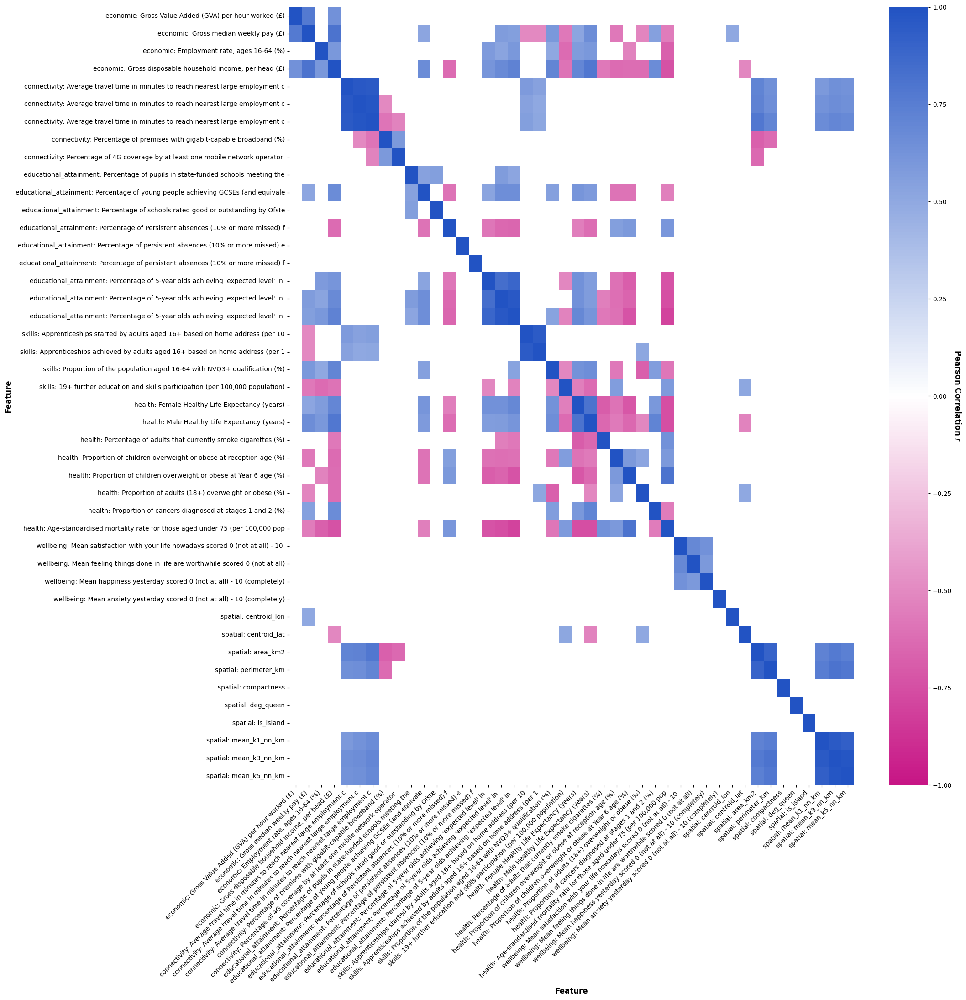

In [17]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

META_COLS = ['Area Code', 'Area', 'Area Level']
# Extract all unique Area Codes across views
area_codes = sorted(
    set().union(*[
        df['Area Code'].dropna().unique()
        for df in views.values()
        if 'Area Code' in df.columns
    ])
)

def plot_filtered_correlation_heatmap(views, area_codes, min_corr=0.5, truncate=80):
    # 1. Prepare combined DataFrame with prefixed feature names
    feature_dfs = []
    for name, df in views.items():
        df = df.copy()
        df = df.replace(r'(?i)^na$', np.nan, regex=True)
        if 'Area Code' in df.columns:
            df = df.set_index('Area Code')
        df = df.drop(columns=[col for col in META_COLS if col in df.columns])
        df = df.apply(pd.to_numeric, errors='coerce')
        df = df.sort_index()
        df.columns = [f"{name}: {col}"[:truncate] for col in df.columns]
        feature_dfs.append(df)

    # Combine all views
    all_features_df = pd.concat(feature_dfs, axis=1)
    all_features_df = all_features_df.loc[area_codes]
    all_features_df = all_features_df.dropna()

    # 2. Compute correlation matrix
    corr_matrix = all_features_df.corr()

    # 3. Mask weak correlations
    mask_weak = corr_matrix.abs() <= min_corr
    corr_filtered = corr_matrix.mask(mask_weak)

    # 4. Create custom colormap
    custom_cmap = mcolors.LinearSegmentedColormap.from_list(
        "custom_diverging",
        ["#C71585", "#ffffff", "#2253C3"],
        N=256
    )

    # 5. Plot heatmap
    n_rows, n_cols = corr_filtered.shape
    fig, ax = plt.subplots(figsize=(max(18, 0.5 * n_cols), max(18, 0.5 * n_rows)))

    sns.heatmap(
        corr_filtered,
        cmap=custom_cmap,
        vmin=-1, vmax=1,
        mask=mask_weak,
        cbar_kws={'label': 'Pearson Correlation $r$'},
        ax=ax
    )

    # Rotate colorbar label
    cbar = ax.collections[0].colorbar
    cbar.ax.set_ylabel('Pearson Correlation $r$', fontsize=12, fontweight='bold', rotation=270, labelpad=15)

    # Rotate x-tick labels and align bottom
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize=10)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=10)
    
    ax.set_xlabel("Feature", fontsize=12, fontweight='bold')
    ax.set_ylabel("Feature", fontsize=12, fontweight='bold')

    plt.savefig(r".\Pictures\Correlations.png", dpi=300, bbox_inches='tight')

    plt.tight_layout()
    plt.show()

    return corr_filtered

corr_df = plot_filtered_correlation_heatmap(views, area_codes)

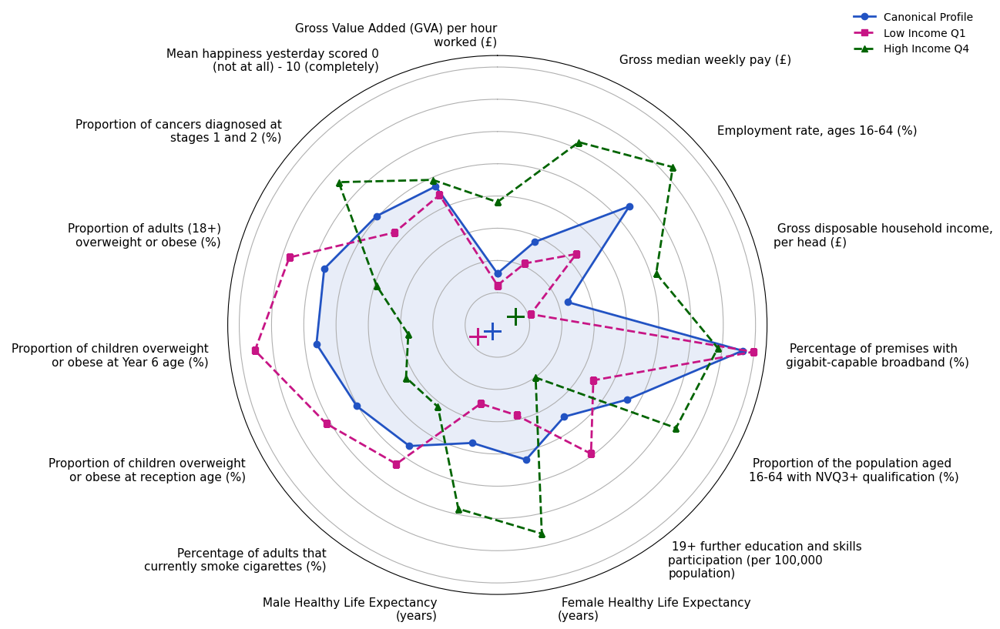

In [18]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import textwrap

def radar_plot_canonical_profile(views, area_codes, canonical_feature_signs, color="#2253C3"):
    META_COLS = ['Area Code', 'Area', 'Area Level']
    
    # Step 1: Combine and preprocess all views
    feature_dfs = []
    for name, df in views.items():
        df = df.copy()
        df = df.replace(r'(?i)^na$', np.nan, regex=True)
        if 'Area Code' in df.columns:
            df = df.set_index('Area Code')
        df = df.drop(columns=[col for col in META_COLS if col in df.columns])
        df = df.apply(pd.to_numeric, errors='coerce')
        df = df.sort_index()
        df.columns = [f"{name}: {col}" for col in df.columns]
        feature_dfs.append(df)

    all_features_df = pd.concat(feature_dfs, axis=1)
    all_features_df = all_features_df.loc[area_codes]
    all_features_df = all_features_df.loc[:, ~all_features_df.columns.duplicated()]
    
    canonical_features = list(canonical_feature_signs.keys())
    available_features = [f for f in canonical_features if f in all_features_df.columns]

    if len(available_features) < 3:
        print("Not enough canonical features available for radar plot.")
        return

    # Step 2: Compute profiles
    df = all_features_df[available_features].dropna()
    median_profile = df.median()

    income_feature = 'economic: Gross disposable household income, per head (£)'
    if income_feature in df.columns:
        income_q25 = df[income_feature].quantile(0.25)
        income_q75 = df[income_feature].quantile(0.75)

        low_income = df[df[income_feature] <= income_q25]
        high_income = df[df[income_feature] >= income_q75]

        low_profile = low_income.median()
        high_profile = high_income.median()
    else:
        low_profile = high_profile = None

    # Step 3: Normalize all on [0, 1]
    min_vals = df.min()
    max_vals = df.max()
    norm = lambda x: (x - min_vals) / (max_vals - min_vals + 1e-8)

    median_norm = norm(median_profile)
    if low_profile is not None and high_profile is not None:
        low_norm = norm(low_profile)
        high_norm = norm(high_profile)

    # Step 4: Radar setup
    features = median_norm.index.tolist()
    num_vars = len(features)
    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
    angles += angles[:1]
    values = median_norm.values.tolist() + [median_norm.values[0]]

    if low_profile is not None and high_profile is not None:
        low_values = low_norm.values.tolist() + [low_norm.values[0]]
        high_values = high_norm.values.tolist() + [high_norm.values[0]]

    fig, ax = plt.subplots(figsize=(10, 10), subplot_kw=dict(polar=True))
    fig.subplots_adjust(left=0.1, right=0.8)
    ax.set_theta_offset(np.pi / 2)
    ax.set_theta_direction(-1)
    ax.set_yticklabels([])
    ax.set_xticks([])

    # Plot canonical profile
    ax.plot(angles, values, color=color, linewidth=2, marker='o', label="Canonical Profile")
    ax.fill(angles, values, color=color, alpha=0.1)

    # Plot archetypes
    if low_profile is not None and high_profile is not None:
        ax.plot(angles, low_values, color="#C71585", linestyle='--', linewidth=2, marker='s', label="Low Income Q1")
        ax.plot(angles, high_values, color="#006400", linestyle='--', linewidth=2, marker='^', label="High Income Q4")

    # Add correlation direction arrows
    for i, raw_label in enumerate(features):
        angle = angles[i]
        short_label = textwrap.fill(raw_label.split(":")[-1], 35)
        alignment = 'left' if 0 < angle < np.pi else 'right'
        ax.text(
            angle,
            0.9,
            short_label,
            size=11,
            horizontalalignment=alignment,
            verticalalignment='center',
            bbox=dict(facecolor='white', alpha=0.8, edgecolor='none', boxstyle='round,pad=0.3')
        )

        sign = canonical_feature_signs.get(raw_label, 0)
        if sign != 0:
            dx = 0.05 * np.cos(angle) * sign
            dy = 0.05 * np.sin(angle) * sign
            ax.annotate(
                '',
                xy=(angle, 1.05),
                xytext=(angle, 1.0),
                textcoords='data',
                arrowprops=dict(
                    arrowstyle="->",
                    color="#006400" if sign > 0 else "#C71585",
                    lw=2
                )
            )
        # Add centroid marker for canonical profile
        x_vals = np.array(values[:-1]) * np.cos(angles[:-1])
        y_vals = np.array(values[:-1]) * np.sin(angles[:-1])
        centroid_x = x_vals.mean()
        centroid_y = y_vals.mean()
        r_centroid = np.sqrt(centroid_x**2 + centroid_y**2)
        theta_centroid = np.arctan2(centroid_y, centroid_x)
        ax.plot([theta_centroid], [r_centroid], marker="+", color=color, markersize=16, markeredgewidth=2)
        
        # Centroid for Low Income Q1
        x_vals_low = np.array(low_values[:-1]) * np.cos(angles[:-1])
        y_vals_low = np.array(low_values[:-1]) * np.sin(angles[:-1])
        centroid_x_low = x_vals_low.mean()
        centroid_y_low = y_vals_low.mean()
        r_centroid_low = np.sqrt(centroid_x_low**2 + centroid_y_low**2)
        theta_centroid_low = np.arctan2(centroid_y_low, centroid_x_low)
        ax.plot([theta_centroid_low], [r_centroid_low], marker="+", color="#C71585", markersize=16, markeredgewidth=2)

        # Centroid for High Income Q4
        x_vals_high = np.array(high_values[:-1]) * np.cos(angles[:-1])
        y_vals_high = np.array(high_values[:-1]) * np.sin(angles[:-1])
        centroid_x_high = x_vals_high.mean()
        centroid_y_high = y_vals_high.mean()
        r_centroid_high = np.sqrt(centroid_x_high**2 + centroid_y_high**2)
        theta_centroid_high = np.arctan2(centroid_y_high, centroid_x_high)
        ax.plot([theta_centroid_high], [r_centroid_high], marker="+", color="#006400", markersize=16, markeredgewidth=2)
        
    ax.legend(loc='upper right', bbox_to_anchor=(1.4, 1.1), frameon=False)
    plt.show()

# Those are the canonical features and their signs extracted after the correlation analysis
canonical_feature_signs = {
    'economic: Gross Value Added (GVA) per hour worked (£)': 1,
    'economic: Gross median weekly pay (£)': 1,
    'economic: Employment rate, ages 16-64 (%)': 1,
    'economic: Gross disposable household income, per head (£)': 1,
    'connectivity: Percentage of premises with gigabit-capable broadband (%)': 1,
    'skills: Proportion of the population aged 16-64 with NVQ3+ qualification (%)': 1,
    'skills: 19+ further education and skills participation (per 100,000 population)': -1,
    'health: Female Healthy Life Expectancy (years)': 1,
    'health: Male Healthy Life Expectancy (years)': 1,
    'health: Percentage of adults that currently smoke cigarettes (%)': -1,
    'health: Proportion of children overweight or obese at reception age (%)': -1,
    'health: Proportion of children overweight or obese at Year 6 age (%)': -1,
    'health: Proportion of adults (18+) overweight or obese (%)': -1,
    'health: Proportion of cancers diagnosed at stages 1 and 2 (%)': 1,
    'wellbeing: Mean happiness yesterday scored 0 (not at all) - 10 (completely)': 1
}

radar_plot_canonical_profile(views, area_codes, canonical_feature_signs)

#### How do ONS Headline Clusters compare?

In [19]:
ONS_clusters_df = pd.read_csv(r"..\Datasets\Final Datasets\clusters_df.csv").set_index("Local_Authority_Code")

# Attach ONS cluster labels to each view
import re
import pandas as pd

def attach_clusters_to_views(
    views: dict,
    clusters_df: pd.DataFrame,
    *,
    code_suffix: str = "_code",
    missing_code: int | None = None,
    order: str = "sorted",
    return_mappings: bool = True
):
    """
    Left-join ONS cluster labels onto each view by 'Area Code' and, in addition,
    create numeric encodings (0..k-1) for each cluster column.

    Returns
    -------
    views_with_clusters : dict[str, pd.DataFrame]
        Each view with the original cluster columns + encoded columns (suffix).
    clusters_encoded : pd.DataFrame
        The clusters table with both original and encoded columns.
    encoders : dict[str, dict]
        Per-column mapping: original_label -> code (0..k-1).
    decoders : dict[str, dict]
        Per-column mapping: code -> original_label.
    """
    def _sorted_unique(vals):
        u = pd.Series(vals).dropna().unique().tolist()
        # robust sort for mixed types
        try:
            return sorted(u)
        except TypeError:
            return sorted(u, key=lambda x: str(x))

    def _appearance_unique(vals):
        # keep first-seen order
        seen, out = set(), []
        for v in vals:
            if pd.isna(v): 
                continue
            if v not in seen:
                seen.add(v); out.append(v)
        return out

    # Normalize cluster index column for merging
    clusters = clusters_df.copy()
    clusters.index = clusters.index.astype(str)
    clusters.index.name = "Area Code"
    clusters = clusters.reset_index()

    # Identify cluster columns
    cluster_cols = [c for c in clusters.columns if re.search(r"cluster", c, re.IGNORECASE)]

    encoders, decoders = {}, {}
    # Build encoded columns (0..k-1) per cluster column
    for col in cluster_cols:
        vals = clusters[col]
        cats = _sorted_unique(vals) if order == "sorted" else _appearance_unique(vals)
        code_map = {lab: i for i, lab in enumerate(cats)}
        inv_map  = {i: lab for lab, i in code_map.items()}

        codes = vals.map(code_map)
        if missing_code is None:
            # keep NaN with pandas nullable int
            codes = codes.astype("Int64")
        else:
            codes = codes.fillna(missing_code).astype(int)

        clusters[col + code_suffix] = codes
        encoders[col] = code_map
        decoders[col] = inv_map

    # Merge encoded clusters into each view
    views_with_clusters = {}
    for view_name, df in views.items():
        df_ = df.copy()
        # ensure 'Area Code' as column of type str
        if 'Area Code' in df_.columns:
            df_['Area Code'] = df_['Area Code'].astype(str)
        else:
            df_.index = df_.index.astype(str)
            df_ = df_.reset_index().rename(columns={df_.columns[0]: 'Area Code'})
        merged = pd.merge(
            df_,
            clusters,
            on='Area Code',
            how='left',
            validate='m:1'
        )
        views_with_clusters[view_name] = merged

    if return_mappings:
        return views_with_clusters, clusters, encoders, decoders
    return views_with_clusters

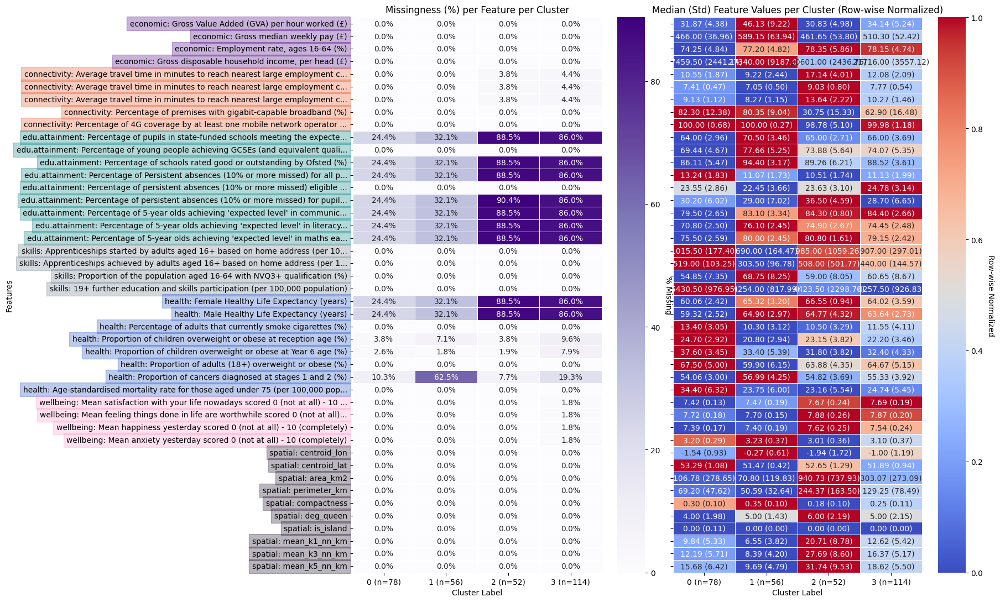

In [20]:
# Pick cluster column
import re
cluster_cols = [c for c in ONS_clusters_df.columns if re.search(r'Headline Model', c, re.IGNORECASE)]
CLUSTER_COL = cluster_cols[0]

# Deterministic encoding: label -> code (0..k-1)
labels_series = ONS_clusters_df[CLUSTER_COL].dropna()

# Stable, predictable order (sorted by string)
unique_labels = sorted(labels_series.unique(), key=lambda x: str(x))

label_to_code = {lab: i for i, lab in enumerate(unique_labels)}
code_to_label = {i: lab for lab, i in label_to_code.items()}

# Persist encoded column (nullable Int64 keeps NaN if any)
ONS_clusters_df[CLUSTER_COL + "_code"] = ONS_clusters_df[CLUSTER_COL].map(label_to_code).astype("Int64")

# Build aligned inputs for plotting
labels_series = ONS_clusters_df[CLUSTER_COL + "_code"].dropna()
labels_series.index = labels_series.index.astype(str) # ensure 'Area Code' dtype matches views

area_codes = labels_series.index.tolist()
labels     = labels_series.astype(int).tolist() # Numeric labels

# Meta cols & palette
META_COLS = ['Area Code', 'Area', 'Area Level', 'Area Name', 'Local Authority', 'LA Name']
views_custom_hex_palette = [
    "#4B0082", "#E55526", "#008080",
    "#708090", "#2253C3", "#FF99CC", "#1D0E2A", "#AFF9A2", "#FFFF00",
]

# Plots
from EDA_plots import plot_missingness_and_means, radar_plot_clusters_on_canonical_features, canonical_feature_signs, custom_hex_palette

_ = plot_missingness_and_means(
    views=views,
    labels=labels,
    area_codes=area_codes,
    META_COLS=META_COLS,
    views_custom_hex_palette=views_custom_hex_palette,
    savepath=None,
    dpi=600,
    use_median=True,
    histogram_normalize_rows=True,
    sort_clusters=True,
    view_shorten_map={"educational_attainment": "edu.attainment"},
)

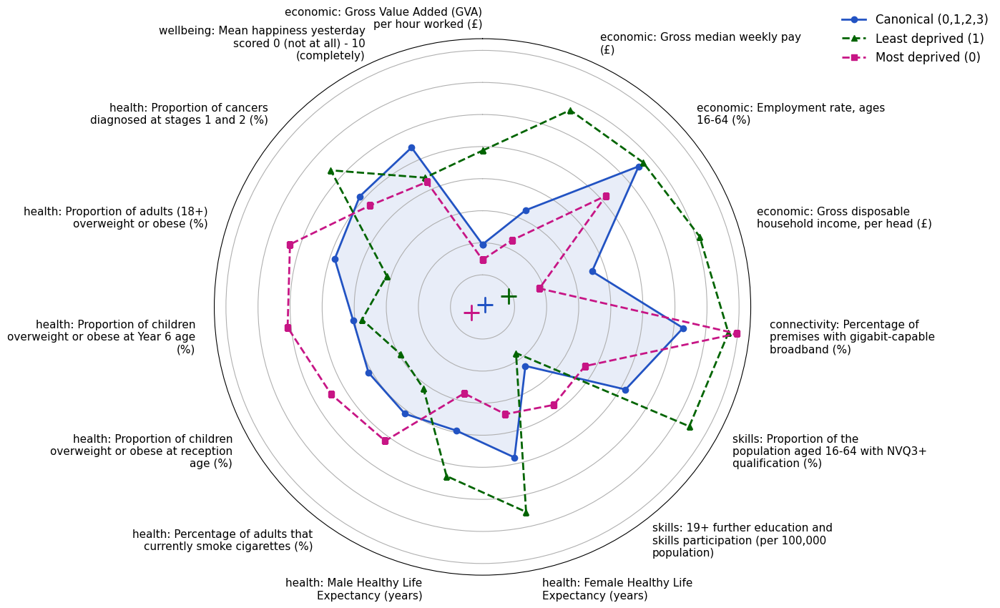

In [21]:
# Canonical radar profiles by cluster
profiles_grouped = radar_plot_clusters_on_canonical_features(
    views=views,
    labels=labels,
    area_codes=area_codes,
    canonical_feature_signs=canonical_feature_signs,
    color_palette=custom_hex_palette,
    direction_align=False,
    strict_complete_cases=False,
    normalization_scope="complete_cases",
    canonical_clusters=None,
    least_deprived_clusters=[1],
    most_deprived_clusters=[0],
    canonical_use_all=True,
)

### Correlations with Missingness

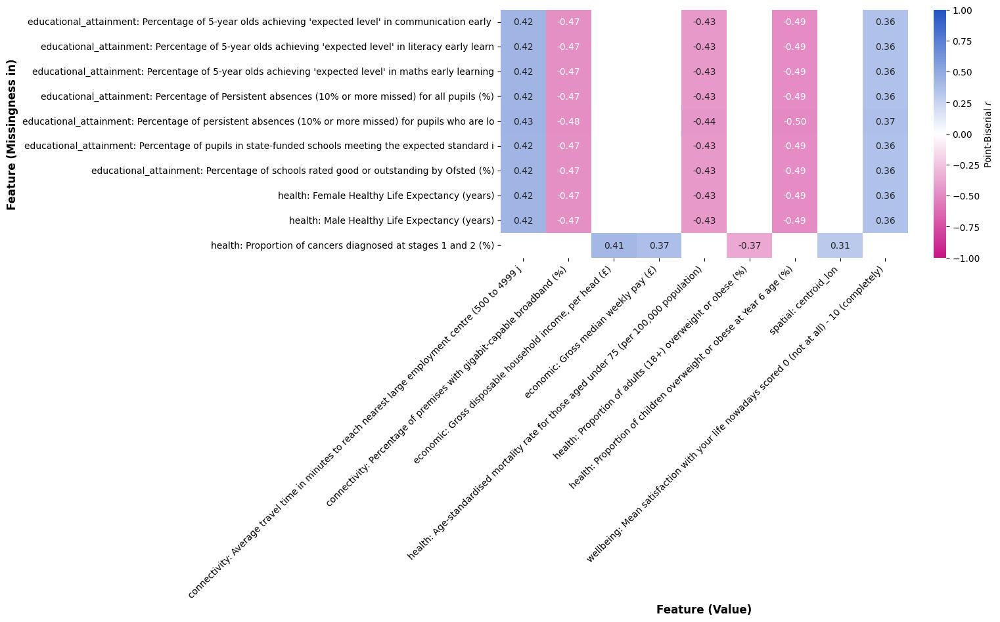

In [22]:
import pandas as pd
import numpy as np
from scipy.stats import pointbiserialr
import seaborn as sns
import matplotlib.pyplot as plt

def build_full_df(views, area_codes, truncate=100):
    feature_dfs = []
    for name, df in views.items():
        df = df.copy()
        df = df.replace(r'(?i)^na$', np.nan, regex=True)
        df = df.set_index('Area Code')
        df = df.drop(columns=[col for col in META_COLS if col in df.columns])
        df = df.apply(pd.to_numeric, errors='coerce')
        df = df.sort_index()
        df.columns = [f"{name}: {col}"[:truncate] for col in df.columns]
        feature_dfs.append(df)

    full_df = pd.concat(feature_dfs, axis=1)
    full_df = full_df.reindex(area_codes)
    full_df = full_df.loc[:, ~full_df.columns.duplicated()]
    return full_df

def compute_missingness_correlation_by_view(full_df, min_missing_pct=10):
    correlations = []
    missing_indicators = full_df.isna().astype(int)
    missing_pct = 100 * missing_indicators.sum(axis=0) / len(full_df)

    # Identify columns >10% missing (to test for missingness bias)
    missing_cols = missing_pct[missing_pct > min_missing_pct].index
    value_cols   = missing_pct[missing_pct <= min_missing_pct].index

    for missing_col in missing_cols:
        for value_col in value_cols:
            series_val = full_df[value_col]
            if isinstance(series_val, pd.DataFrame):
                series_val = series_val.iloc[:, 0]

            valid_idx = ~series_val.isna()
            if valid_idx.sum() > 10:
                try:
                    r, p = pointbiserialr(
                        missing_indicators.loc[valid_idx, missing_col],
                        series_val.loc[valid_idx]
                    )
                    correlations.append({
                        'missing_in': missing_col,
                        'feature': value_col,
                        'r': r,
                        'p': p
                    })
                except Exception as e:
                    print(f"Skipping: {missing_col} vs {value_col} — {e}")
    return pd.DataFrame(correlations)

def plot_missingness_correlation_heatmap(corr_df, r_thresh=0.3, p_thresh=0.05):
    import matplotlib.pyplot as plt
    import seaborn as sns
    import matplotlib.colors as mcolors

    filtered = corr_df[(corr_df['r'].abs() > r_thresh) & (corr_df['p'] < p_thresh)]
    if filtered.empty:
        print("No correlations pass the thresholds.")
        return

    # Create custom diverging colormap
    custom_cmap = mcolors.LinearSegmentedColormap.from_list(
        "custom_diverging", [("#C71585"), "#ffffff", ("#2253C3")], N=256
    )

    # Pivot for heatmap
    pivot = filtered.pivot(index="missing_in", columns="feature", values="r")

    # Dynamic figure size
    n_rows, n_cols = pivot.shape
    fig, ax = plt.subplots(figsize=(max(10, 0.5 * n_cols), max(6, 0.4 * n_rows)))

    # Plot heatmap
    sns.heatmap(
        pivot,
        cmap=custom_cmap,
        vmin=-1,
        vmax=1,
        center=0,
        annot=True,
        fmt=".2f",
        ax=ax,
        cbar_kws={'label': 'Point-Biserial $r$'}
    )

    # Rotate x-axis labels after heatmap is drawn
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0)

    # Tidy layout after rotation
    fig.subplots_adjust(bottom=0.25)  # Extra space for long x labels

    ax.set_xlabel("Feature (Value)", fontsize=12, fontweight='bold')
    ax.set_ylabel("Feature (Missingness in)", fontsize=12, fontweight='bold')
    # ax.set_title("Correlation Between Feature Values and Missingness", fontsize=14, fontweight='bold')

    plt.show()

# --- Usage ---
# views and area_codes should be defined
full_df = build_full_df(views, area_codes)
corr_df = compute_missingness_correlation_by_view(full_df, min_missing_pct=10)
plot_missingness_correlation_heatmap(corr_df)


Even if indicating moderate correlations, those $r$ are statistically significant.

This suggests that missingness is not completely random: it is informatively linked to the distribution of other features.

It justifies careful handling.

In [23]:
missingness_matrix = pd.DataFrame({name: df.isna().mean(axis=1) for name, df in views.items()})
missingness_matrix.corr()

,economic,connectivity,educational_attainment,skills,health,wellbeing,spatial
economic,NaN,NaN,NaN,NaN,NaN,NaN,NaN
connectivity,NaN,1.000000,0.067424,NaN,0.181839,-0.046208,NaN
educational_attainment,NaN,0.067424,1.000000,NaN,0.783794,-0.013664,NaN
skills,NaN,NaN,NaN,NaN,NaN,NaN,NaN
health,NaN,0.181839,0.783794,NaN,1.000000,-0.035482,NaN
wellbeing,NaN,-0.046208,-0.013664,NaN,-0.035482,1.000000,NaN
spatial,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Export views in .xlsx

In [24]:
# Export to Excel with one sheet per view
with pd.ExcelWriter(r"..\Datasets\Final Datasets\subnationalindicatorsdataset.xlsx",
                    engine="openpyxl") as writer:
    for sheet_name, df in views.items():
        df.to_excel(writer, sheet_name=sheet_name, index=False)

# Imputed Data

## Local Authorities Tiers mapping and imputation function

File publicly available at: https://www.data.gov.uk/dataset/ccacfb62-302e-4655-915c-176727e68ff8/local-authority-district-to-county-and-unitary-authority-april-2021-lookup-in-ew

In [25]:
LA_tiers_mapping = pd.read_csv(r"..\Datasets\Local_Authorities_Tiers_mapping.csv")

LA_tiers_mapping = LA_tiers_mapping.set_index('LAD21CD')['CTYUA21CD'].to_dict()

def impute_by_tier_mapping(df: pd.DataFrame, la_mapping: dict, code_col: str = "Area Code") -> pd.DataFrame:
    df_imputed = df.copy()
    
    for child_code, parent_code in la_mapping.items():
        # Get the index of the child row
        child_idx = df_imputed[df_imputed[code_col] == child_code].index
        if child_idx.empty:
            continue

        child_idx = child_idx[0]

        # Get the parent row
        parent_row = df_imputed[df_imputed[code_col] == parent_code]
        if parent_row.empty:
            continue

        parent_row = parent_row.iloc[0]

        # For each column (excluding Area Code), fill missing in child from parent
        for col in df_imputed.columns:
            if col == code_col:
                continue
            if pd.isna(df_imputed.at[child_idx, col]) and not pd.isna(parent_row[col]):
                df_imputed.at[child_idx, col] = parent_row[col]

    return df_imputed

## Imputed views

In [26]:
# Impute each raw view before any filtering
economic_df_imputed = impute_by_tier_mapping(economic_df, LA_tiers_mapping)
connectivity_df_imputed = impute_by_tier_mapping(connectivity_df, LA_tiers_mapping)
edu_attainment_df_imputed = impute_by_tier_mapping(edu_attainment_df, LA_tiers_mapping)
skills_df_imputed = impute_by_tier_mapping(skills_df, LA_tiers_mapping)
health_df_imputed = impute_by_tier_mapping(health_df, LA_tiers_mapping)
wellbeing_df_imputed = impute_by_tier_mapping(wellbeing_df, LA_tiers_mapping)

views_imputed = {
    'economic': economic_df_imputed[economic_df_imputed['Area Level'].isin(Authorities_types)],
    'connectivity': connectivity_df_imputed[connectivity_df_imputed['Area Level'].isin(Authorities_types)],
    'educational_attainment': edu_attainment_df_imputed[edu_attainment_df_imputed['Area Level'].isin(Authorities_types)],
    'skills': skills_df_imputed[skills_df_imputed['Area Level'].isin(Authorities_types)],
    'health': health_df_imputed[health_df_imputed['Area Level'].isin(Authorities_types)],
    'wellbeing': wellbeing_df_imputed[wellbeing_df_imputed['Area Level'].isin(Authorities_types)]
}


## Analysis

In [27]:
from collections import defaultdict
from ONS_implementation import preprocess_view, ONS_EXCLUSIONS

# Run diagnostics on imputed views
views = views_imputed

raw_shapes = {}
missing_counts = {}
processed_shapes = {}
excluded_counts = {}
area_codes_by_view = {}

print("=== View Diagnostics ===")
for view_name, df in views.items():
    raw_shapes[view_name] = df.shape
    missing_counts[view_name] = df.isnull().any(axis=1).sum()

    raw_area_codes = set(df["Area Code"])
    exclusions = set(ONS_EXCLUSIONS.get(view_name, []))
    excluded_counts[view_name] = len(raw_area_codes & exclusions)

    df_processed = preprocess_view(df, view_name)
    processed_shapes[view_name] = df_processed.shape
    area_codes_by_view[view_name] = set(df_processed.index)

    print(f"\n[{view_name}]")
    print(f"  Raw shape: {raw_shapes[view_name]}")
    print(f"  Rows with missing data: {missing_counts[view_name]}")
    print(f"  After preprocessing: {processed_shapes[view_name]}")
    print(f"  Excluded Area Codes: {excluded_counts[view_name]}")


=== View Diagnostics ===

[economic]
  Raw shape: (309, 7)
  Rows with missing data: 0
  After preprocessing: (307, 4)
  Excluded Area Codes: 2

[connectivity]
  Raw shape: (340, 8)
  Rows with missing data: 38
  After preprocessing: (302, 5)
  Excluded Area Codes: 8

[educational_attainment]
  Raw shape: (309, 12)
  Rows with missing data: 4
  After preprocessing: (303, 9)
  Excluded Area Codes: 6

[skills]
  Raw shape: (309, 7)
  Rows with missing data: 0
  After preprocessing: (307, 4)
  Excluded Area Codes: 3

[health]
  Raw shape: (320, 11)
  Rows with missing data: 14
  After preprocessing: (218, 8)
  Excluded Area Codes: 18

[wellbeing]
  Raw shape: (309, 7)
  Rows with missing data: 2
  After preprocessing: (307, 4)
  Excluded Area Codes: 2


## Export views in .xlsx

In [28]:
# Export to Excel with one sheet per view
with pd.ExcelWriter(r"..\Datasets\Final Datasets\subnationalindicatorsdataset_IMPUTED.xlsx",
                    engine="openpyxl") as writer:
    for sheet_name, df in views.items():
        df.to_excel(writer, sheet_name=sheet_name, index=False)